In [1]:
import xarray as xr
#import rioxarray as rxr
import xesmf as xe
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter

from pyproj import CRS,Transformer,Proj

import sys
sys.path.insert(1, '/home/castelli/Notebooks/PhD/utils') # to include my util file in previous directory
import utils as u
u.check_python_version()

3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]


In [2]:
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-EC-Earth3/MARgrid_EUe.nc')

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
lon = np.array(ds.LON[jmin:jmax,imin:imax])
lat = np.array(ds.LAT[jmin:jmax,imin:imax])
H = np.array(ds.SH[jmin:jmax,imin:imax])
nlat,nlon = 91, 139

normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
big_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
              'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[41.,50],'lonlim':[0.,20.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False, 'lonlines':2,
                    'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

veg_mar = ['No Veg.', # 0
           'Crops Low', # 1
           'Crops Medium', # 2
           'Crops High', # 3
           'Grass low', # 4
           'Grass Medium', # 5
           'Grass High', # 6
           'Broadleaf Low', # 7
           'Broadleaf Medium', # 8
           'Broadleaf High', # 9
           'Needle Low', # 10
           'Needle Medium', # 11
           'Needle High', # 12
           'City'] # 13

In [3]:
ds_small = xr.open_dataset('/bettik/castelli/MARout/EUh/h01/2015/ICE.h01.2015.01.01-31.nc')[["LON","LAT","SH","FRV","VEG"]]
#ds_smallish = xr.open_dataset('/bettik/castelli/MARout/EUm/m01/2014/ICE.m01.2014.09.01-30.nc')[["LON","LAT","SH","FRV","VEG"]]
ds_smallish = xr.open_dataset('/bettik/castelli/data/MAR-MPI-ESM/v3.14/MARgrid_EUm.nc')
ds_big = xr.open_dataset('/bettik/castelli/MARout/EUn/n01/2014/ICE.n01.2014.09.01-30.nc')[["LON","LAT","SH","FRV","VEG"]]

In [4]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool_(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False

alps_month = np.repeat(alps[np.newaxis,:,:],12,axis=0)

lon_smallish = np.array(ds_smallish.LON)
lat_smallish = np.array(ds_smallish.LAT)
H_smallish = np.array(ds_smallish.SH)
alps_smallish = detect_alps(H_smallish)
alps_smallish[lon_smallish<4.8] = False
alps_smallish[np.logical_and(lon_smallish>10,lat_smallish<45.2)] = False

In [5]:
def open_monthly_data_ave(vars,year,month,days_in_month,sim,timestep_in_hours = 2,imin = 32,imax = -30,jmin = 20,jmax = -15,whichpath='castelli',
                         ds_sect = ds_small,combine=False):
    # average of mosaics
    # example of vars : ["GF","SWU","SWD","HAcc","LWU","LWD","SHF","LHF","HA_col","MBm","MBr","MBmTop","MBrTop","MB","MBrr","SAbs_v","SAbs","CC","CU","CM","CD",
    #                    "QQz","TTz","ST","SWt"]
    if whichpath=='castelli':
        path = '/bettik/castelli/MARout/EU'
    else:
        path = '/bettik/menegozm/MARout/EU'
    letter = sim[0]
    code = sim[1:]
    path = path+letter+'/'+letter+code+'/'+year+'/ICE.'+letter+code+'.'+year+'.'

    #ds_day = xr.open_dataset(path+letter+'/'+letter+code+'/'+year+'/ICE.'+letter+code+'.'+year+'.'+month+'.01-'+days_in_month+'.nc')[vars].isel(x=slice(imin,imax),
    #                                                                                                                                                y=slice(jmin,jmax))
    if combine:
        files = []
        for i in range(len(month)):
            files.append(path+month[i]+'.01-'+days_in_month[i]+'.nc')
        ds_day = xr.open_mfdataset(files,concat_dim='time', data_vars='minimal',combine='nested',coords='minimal',compat='override')[vars].isel(x=slice(imin,imax),
                                                                                                                                                y=slice(jmin,jmax))
    else:
        ds_day = xr.open_dataset(path+month+'.01-'+days_in_month+'.nc')[vars].isel(x=slice(imin,imax),y=slice(jmin,jmax))
        
    # Melt
    Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
    t_timestep = 60*60*timestep_in_hours # 60*60*24 seconds in a day
    if('MBm' in vars):
        melt_MBm = ds_day.MBm.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBm.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBm.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100 # in mm = L.m**(-2) = kg.m**(-2) because for liquid water 1L=1kg
        ds_day_melt = melt_MBm * Lf / t_timestep # kg.m**(-2) * J.kg**(-1) / s = J/s.m**(-2) = W.m**(-2)
        ds_day['melt'] = -ds_day_melt # minus sign because energy is LOST by surface in order to melt snow
    if('MBr' in vars):
        freez_MBr = ds_day.MBr.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBr.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MBr.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez = freez_MBr * Lf / t_timestep
        ds_day['freeze'] = ds_day_freez
    if('MBmTop' in vars):
        melt_MBm_top = ds_day.MBmTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBmTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBmTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_melt_top = melt_MBm_top * Lf / t_timestep
        ds_day['melt_top'] = -ds_day_melt_top
    if('MBrTop' in vars):
        freez_MBr_top = ds_day.MBrTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBrTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBrTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez_top = freez_MBr_top * Lf / t_timestep
        ds_day['freeze_top'] = ds_day_freez_top
    if('MB' in vars):
        average_snow = ds_day.MB.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MB.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MB.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day['MBave'] = average_snow
    if('SWD' in vars and 'SWU' in vars):
        ds_day['NSW'] = ds_day.SWD - ds_day.SWU
    if('LWD' in vars and 'LWU' in vars):
        ds_day['NLW'] = ds_day.LWD - ds_day.LWU
    if('TTz' in vars):
        ds_day['TT2'] = ds_day.TTz.sel(ztqlev=2.0)
    if('SWt' in vars):
        ds_day['SWt'] = -ds_day['SWt'] # - sign because the energy transmitted to lower layers is LOST by the surface
    if('MBrr' in vars and 'MBsf' in vars):
        ds_day['precip'] = ds_day.MBrr + ds_day.MBsf
    if('SWD' in vars and 'SWU' in vars and 'LWD' in vars and 'LWU' in vars and 'SHF' in vars and 'LHF' in vars and 'MBmTop' in vars and 'MBrTop' in vars and 'GF' in vars
       and 'HAcc' in vars and 'SWt' in vars):
        ds_day_surf_balance = ds_day.NSW + ds_day.NLW + ds_day.SHF + ds_day.LHF + ds_day.melt_top + ds_day.freeze_top + ds_day.GF + ds_day.HAcc + ds_day.SWt
        ds_day['Surf_Bal'] = ds_day_surf_balance

    return ds_day

In [6]:
def plot_comparison(list_ds,months,min,max,colormap,label_var,suptitle_var,ds_size=ds_small,N=11,cols=5,rows=2):

    f, axs = pplt.subplots(proj='cyl',axwidth=2,ncols=cols,nrows=rows,axheight=1.)

    for mon in range(cols*rows):    
        ax=axs[mon]
        m = ax.pcolormesh(ds_size.LON,ds_size.LAT,list_ds[mon],levels=np.linspace(min,max,N),cmap=colormap)
        ax.format(title=months[mon])

    f.colorbar(m,label= label_var,labelsize='large',ticklabelsize='large')
    axs.format(**multiplot_format,suptitle=suptitle_var)

In [7]:
def open_nc_monthly(scenario,first_year,last_year,ds_sect):
    inipath = '/bettik/castelli/data/MAR-MPI-ESM/v3.14/'+scenario+'/ICE.MPI_ESM_'+scenario+'.EUm.' # initial path

    for year in range(first_year,last_year):
        ds_monthly = xr.open_dataset(inipath+list_var[0]+'.'+str(year)+'.nc').resample(time='M').mean()

        for var in list_vars[1:]:
            ds_monthly[var] = xr.open_dataset(inipath+var+'.'+str(year)+'.nc').resample(time='M').mean()

    # Melt
    Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
    t_timestep = 60*60*24*complete # 60*60*24 seconds in a day
    if('MBm' in vars):
        melt_MBm = ds_monthly.MBm.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_monthly.MBm.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_monthly.MBm.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100 # in mm = L.m**(-2) = kg.m**(-2) because for liquid water 1L=1kg
        ds_monthly_melt = melt_MBm * Lf / t_timestep # kg.m**(-2) * J.kg**(-1) / s = J/s.m**(-2) = W.m**(-2)
        ds_monthly['melt'] = -ds_monthly_melt # minus sign because energy is LOST by surface in order to melt snow
    if('MBr' in vars):
        freez_MBr = ds_day.MBr.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBr.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MBr.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez = freez_MBr * Lf / t_timestep
        ds_day['freeze'] = ds_day_freez
    if('MBmTop' in vars):
        melt_MBm_top = ds_day.MBmTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBmTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBmTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_melt_top = melt_MBm_top * Lf / t_timestep
        ds_day['melt_top'] = -ds_day_melt_top
    if('MBrTop' in vars):
        freez_MBr_top = ds_day.MBrTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBrTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBrTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez_top = freez_MBr_top * Lf / t_timestep
        ds_day['freeze_top'] = ds_day_freez_top
    if('MB' in vars):
        average_snow = ds_day.MB.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MB.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MB.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day['MBave'] = average_snow
    if('SWD' in vars and 'SWU' in vars):
        ds_day['NSW'] = ds_day.SWD - ds_day.SWU
    if('LWD' in vars and 'LWU' in vars):
        ds_day['NLW'] = ds_day.LWD - ds_day.LWU
    if('TTz' in vars):
        ds_day['TT2'] = ds_day.TTz.sel(ztqlev=2.0)
    if('SWt' in vars):
        ds_day['SWt'] = -ds_day['SWt'] # - sign because the energy transmitted to lower layers is LOST by the surface
    if('MBrr' in vars and 'MBsf' in vars):
        ds_day['precip'] = ds_day.MBrr + ds_day.MBsf
    if('SWD' in vars and 'SWU' in vars and 'LWD' in vars and 'LWU' in vars and 'SHF' in vars and 'LHF' in vars and 'MBmTop' in vars and 'MBrTop' in vars and 'GF' in vars
       and 'HAcc' in vars and 'SWt' in vars):
        ds_day_surf_balance = ds_day.NSW + ds_day.NLW + ds_day.SHF + ds_day.LHF + ds_day.melt_top + ds_day.freeze_top + ds_day.GF + ds_day.HAcc + ds_day.SWt
        ds_day['Surf_Bal'] = ds_day_surf_balance

In [8]:
def plot_E_balance_and_T(slopes_var=None,trend=True,year=None,first_year=None,last_year=None,showlegend=True,snowlines=False):
    pplt.rc.update(small=14, large=12)

    n_levels=len(levels)
    n_seas=4
    seasons=['DJF','MAM','JJA','SON']
    colors = ['b','g','r','c','y','m','purple','lightblue','orange','k']
    leg_labels_null = ['','','','','','','','','','']
    leg_labels_full = ['Tmean','Tmin','Tmax','STmean','NSW','NLW','LHF','SHF','Melt','NSW+NLW+LHF+SHF+Melt']
    leg_labels = [leg_labels_full,leg_labels_null,leg_labels_null,leg_labels_null]


    with pplt.rc.context({'suptitle.weight': 'normal', 'suptitle.size': 14}):
        f, axs = pplt.subplots(ncols=4,axwidth=3)
    axs2 = axs.twiny()
    
    mean_slope_T=np.full((n_seas,n_levels),np.nan)
    mean_slope_Tmin=np.full((n_seas,n_levels),np.nan)
    mean_slope_Tmax=np.full((n_seas,n_levels),np.nan)
    mean_slope_ST=np.full((n_seas,n_levels),np.nan)
    mean_slope_NSW=np.full((n_seas,n_levels),np.nan)
    mean_slope_NLW=np.full((n_seas,n_levels),np.nan)
    mean_slope_LHF=np.full((n_seas,n_levels),np.nan)
    mean_slope_SHF=np.full((n_seas,n_levels),np.nan)
    mean_slope_MBm=np.full((n_seas,n_levels),np.nan)
    mean_slope_energy_balance=np.full((n_seas,n_levels),np.nan)
    mean_slopes = [mean_slope_T,mean_slope_Tmin,mean_slope_Tmax,mean_slope_ST,mean_slope_NSW,mean_slope_NLW,mean_slope_LHF,mean_slope_SHF,mean_slope_MBm,
                   mean_slope_energy_balance]

    std_slope_T=np.full((n_seas,n_levels),np.nan)
    std_slope_Tmin=np.full((n_seas,n_levels),np.nan)
    std_slope_Tmax=np.full((n_seas,n_levels),np.nan)
    std_slope_ST=np.full((n_seas,n_levels),np.nan)
    std_slope_NSW=np.full((n_seas,n_levels),np.nan)
    std_slope_NLW=np.full((n_seas,n_levels),np.nan)
    std_slope_LHF=np.full((n_seas,n_levels),np.nan)
    std_slope_SHF=np.full((n_seas,n_levels),np.nan)
    std_slope_MBm=np.full((n_seas,n_levels),np.nan)
    std_slope_energy_balance=np.full((n_seas,n_levels),np.nan)
    std_slopes = [std_slope_T,std_slope_Tmin,std_slope_Tmax,std_slope_ST,std_slope_NSW,std_slope_NLW,std_slope_LHF,std_slope_SHF,std_slope_MBm,
                  std_slope_energy_balance]

    wp_meanseason_vars = [wp_meanseason_meanT,wp_meanseason_minT,wp_meanseason_maxT,wp_meanseason_ST,wp_meanseason_meanNSW,wp_meanseason_NLW,wp_meanseason_LHF,
                          wp_meanseason_SHF,wp_meanseason_meltflux,wp_meanseason_energy_balance]
    
    for i in range(n_seas): # seasons
        ax = axs[i]
        ax2 = axs2[i]
        
        for j in range(n_levels): # levels
            for var in range(len(wp_meanseason_vars)):
                if trend:
                    slope_var = np.ma.masked_array(slopes_var[var][i], mask=np.invert(levels[j])).reshape(12649)
                    multiplier = 10 # trends per decade so we x10
                elif first_year != None: # not a trend, but averaging over first_year:last_year
                    slope_var = np.ma.masked_array(wp_meanseason_vars[var][first_year:last_year,i].mean(axis=0), mask=np.invert(levels[j])).reshape(12649)
                    multiplier = 1
                else: # taking one year in particular
                    slope_var = np.ma.masked_array(wp_meanseason_vars[var][year-1961,i], mask=np.invert(levels[j])).reshape(12649)
                    multiplier = 1
                
                mean_slopes[var][i,j] = multiplier*slope_var.mean()
                std_slopes[var][i,j] = multiplier*slope_var.std()
                if var<4:
                    ax.plot([multiplier*slope_var.mean()-multiplier*slope_var.std(),multiplier*slope_var.mean()+multiplier*slope_var.std()],[H_levels[j],H_levels[j]],c=colors[var])
                else:
                    ax2.plot([multiplier*slope_var.mean()-multiplier*slope_var.std(),multiplier*slope_var.mean()+multiplier*slope_var.std()],[H_levels[j],H_levels[j]],c=colors[var])


        ax.plot(mean_slope_T[i,:],H_levels,c='b',linestyle='--',label=leg_labels[i][0])
        ax.plot(mean_slope_Tmin[i,:],H_levels,c='g',linestyle='--',label=leg_labels[i][1])
        ax.plot(mean_slope_Tmax[i,:],H_levels,c='r',linestyle='--',label=leg_labels[i][2])
        ax.plot(mean_slope_ST[i,:],H_levels,c='c',linestyle='--',label=leg_labels[i][3])

        if trend:
            ax.set_xlim(-0.5,1.3)
            ax.text(1., 75, seasons[i], fontsize=13,fontweight='semibold')
        else:
            ax.set_xlim(-55.,35)
            ax.text(20, 75, seasons[i], fontsize=13,fontweight='semibold')

        ax.set_ylim(0,3400)
        
        if snowlines:
            #ax.hlines(mean1_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
            #ax.hlines(mean1_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
            #ax.hlines(mean1_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
            ax.hlines(mean10_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
            ax.hlines(mean10_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
            ax.hlines(mean10_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
        
        ax2.vlines(0,0,3500,c='k',linestyle=':',alpha=0.4)
        ax2.plot(mean_slope_NSW[i,:],H_levels,c='y',label=leg_labels[i][4])
        ax2.plot(mean_slope_NLW[i,:],H_levels,c='m',label=leg_labels[i][5])
        ax2.plot(mean_slope_LHF[i,:],H_levels,c='purple',label=leg_labels[i][6])
        ax2.plot(mean_slope_SHF[i,:],H_levels,c='lightblue',label=leg_labels[i][7])
        ax2.plot(mean_slope_MBm[i,:],H_levels,c='orange',label=leg_labels[i][8])
        ax2.plot(mean_slope_energy_balance[i,:],H_levels,c='k',label=leg_labels[i][9])
        #ax2.plot(mean_slope_NSW[i,:]+mean_slope_NLW[i,:]+mean_slope_LHF[i,:]+mean_slope_SHF[i,:],H_levels,c='k',linestyle='--')

        if trend:
            ax2.set_xlim(-6,15)
        else:
            ax2.set_xlim(-90,320)
        

    if showlegend:
        f.legend(loc='b',prop = { "size": 14 },ncols=4)
    
    if trend:
        xLabel = 'T trend (°C/decade)'
        Suptitle='Surface energy flux trend (W/$m^2$/dec)'
    else:
        xLabel = 'T (°C)'
        Suptitle='Surface energy flux (W/$m^2$)'

    if year != None:
        axs[0].text(x=10,y=3000,s=f'Year = {year}')
    axs.format(xlabel=xLabel,ylabel='Altitude (m.a.s.l.)',suptitle=Suptitle)


In [9]:
# function for seasonal mean (from Ian)
def season_mean(ds, calendar="standard"):
    #make a DataArray with the season of each day
    seas_array = ds.time.dt.season
    
    # count days in winter season (varies with leap years)
    nb_DJF = seas_array.str.count('DJF').sum()
    
    wgt_DJF = 1/nb_DJF.values.item()
    wgt_MAM = 1/(31+30+31)
    wgt_JJA = 1/(30+31+31)
    wgt_SON = 1/(30+31+30)

    weight = seas_array.str.replace('DJF',str(wgt_DJF)).str.replace('MAM',str(wgt_MAM)).str.replace('JJA',str(wgt_JJA)).str.replace('SON',str(wgt_SON))
    weight = weight.astype('float')
    
    # Test that the sum of the weights for each season is 1.0
    np.testing.assert_allclose(weight.groupby("time.season").sum().values, np.ones(4))

    # Calculate the weighted average
    return (ds * weight).groupby("time.season").sum(dim="time")

In [10]:
# function for seasonal mean (from Ian)
def season_mean2(ds, calendar="standard"):
    #make a DataArray with the season of each day
    seas_array = ds.time.dt.season
    
    # count days in winter season (varies with leap years)
    nb_DJF = seas_array.str.count('DJF').sum()
    
    wgt_DJF = 1/nb_DJF.values.item()
    wgt_MAM = 1/(31+30+31)
    wgt_JJA = 1/(30+31+31)
    wgt_SON = 1/(30+31+30)

    weight = seas_array.str.replace('DJF',str(wgt_DJF)).str.replace('MAM',str(wgt_MAM)).str.replace('JJA',str(wgt_JJA)).str.replace('SON',str(wgt_SON))
    weight = weight.astype('float')
    
    # Test that the sum of the weights for each season is 1.0
    np.testing.assert_allclose(weight.groupby("time.season").sum().values, np.ones(4))

    # Calculate the weighted average
    return (ds * weight).resample(time='QS-DEC').sum()

In [12]:
ds_var.TTz.isel(ztqlev=0)

<xarray.DataArray 'TTz' (time: 365, y: 126, x: 201)>
[9243990 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01T12:00:00 ... 2015-12-31T12:00:00
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
    ztqlev   float32 2.0
Attributes:
    units:          C
    long_name:      Temperature
    standard_name:  Temperature
    actual_range:   [-30.954214  20.586706]

### Comparison v3.14 vs v3.10, MAR-MPI SSP585, 7km resolution on big domain for both

In [11]:
# MARv3.10
name_GCM = 'MPI-ESM1-2-HR'
code_GCM = 'MPI-ESM'
scenario = 'SSP585'
sim = 'EUy'
sim2 = 'EUy'
data_freq = 'daily'
data_freq_prefix = 'ICE' # ICE for daily, MON for monthly
year = 2015

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+'.TTz.'+str(year)+'.nc'
ds_EUy2015 = xr.open_dataset(ssp585_path)


ds_EUy2015['CC'] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.CC.'+str(year)+'.nc').CC
ds_EUy2015["MBrr"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBrr.'+str(year)+'.nc').MBrr
ds_EUy2015["MBsf"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBsf.'+str(year)+'.nc').MBsf
ds_EUy2015["SWD"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.SWD.'+str(year)+'.nc').SWD
ds_EUy2015["QQz"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.QQz.'+str(year)+'.nc').QQz
ds_EUy2015["ST"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.ST.'+str(year)+'.nc').ST
ds_EUy2015["TTp"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.TTp.'+str(year)+'.nc').TTp

ds_EUy2015["precip"] = ds_EUy2015["MBrr"] + ds_EUy2015["MBsf"]

In [67]:
# MARv3.10
name_GCM = 'ERA5'
code_GCM = 'ERA5_v1'
#scenario = 'SSP585'
sim = 'EUl'
sim2 = 'EUl'
data_freq = 'daily'
data_freq_prefix = 'ICE' # ICE for daily, MON for monthly
year = 2015

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+'.TTz.'+str(year)+'.nc'
ds_EUl2015 = xr.open_dataset(ssp585_path)


ds_EUl2015['CC'] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
                                   '.CC.'+str(year)+'.nc').CC
ds_EUl2015["MBrr"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
                                   '.MBrr.'+str(year)+'.nc').MBrr
ds_EUl2015["MBsf"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
                                   '.MBsf.'+str(year)+'.nc').MBsf
ds_EUl2015["SWD"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
                                   '.SWD.'+str(year)+'.nc').SWD
ds_EUl2015["QQz"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
                                   '.QQz.'+str(year)+'.nc').QQz
ds_EUl2015["ST"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
                                   '.ST.'+str(year)+'.nc').ST
#ds_EUl2015["TTp"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'.'+sim2+ \
#                                   '.TTp.'+str(year)+'.nc').TTp

ds_EUl2015["precip"] = ds_EUl2015["MBrr"] + ds_EUl2015["MBsf"]

In [71]:
vars_list = ["SWU","SWD","CC","QQz","TTz","ST"]
ds_EUn012015 = open_monthly_data_ave(vars=vars_list,year='2015',month=['01','02','03','04','05','06','07','08','09','10','11'],
                                     days_in_month=['31','28','31','30','31','30','31','31','30','31','30'],sim='n01',timestep_in_hours = 4,
                                         imin = 0, imax = None, jmin = 0, jmax = None, whichpath='castelli', combine=True, ds_sect = ds).resample(time='D').mean()

vars_list = ["MBrr","MBsf"]
ds_EUn012015_precip = open_monthly_data_ave(vars=vars_list,year='2015',month=['01','02','03','04','05','06','07','08','09','10','11'],
                                     days_in_month=['31','28','31','30','31','30','31','31','30','31','30'],sim='n01',timestep_in_hours = 4,
                                         imin = 0, imax = None, jmin = 0, jmax = None, whichpath='castelli', combine=True, ds_sect = ds).resample(time='D').sum()

In [13]:
ds_EUy2015 = ds_EUy2015.assign_coords(x=ds_EUn012015.x)
ds_EUy2015 = ds_EUy2015.assign_coords(y=ds_EUn012015.y).isel(y=slice(jmin,jmax),x=slice(imin,imax))

In [72]:
ds_EUl2015 = ds_EUl2015.assign_coords(x=ds_EUn012015.x)
ds_EUl2015 = ds_EUl2015.assign_coords(y=ds_EUn012015.y).isel(y=slice(jmin,jmax),x=slice(imin,imax))

In [87]:
ds_EUn012015 = ds_EUn012015.isel(y=slice(jmin,jmax),x=slice(imin,imax))
ds_EUn012015_precip = ds_EUn012015_precip.isel(y=slice(jmin,jmax),x=slice(imin,imax))

In [15]:
ds_EUy2015

<xarray.Dataset>
Dimensions:  (time: 365, ztqlev: 4, y: 91, x: 139, plev: 7)
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01T12:00:00 ... 2015-12-31T12:00:00
  * x        (x) float32 -259.0 -252.0 -245.0 -238.0 ... 686.0 693.0 700.0 707.0
  * y        (y) float32 -168.0 -161.0 -154.0 -147.0 ... 441.0 448.0 455.0 462.0
  * ztqlev   (ztqlev) float32 2.0 10.0 50.0 100.0
  * plev     (plev) float32 925.0 850.0 800.0 700.0 600.0 500.0 200.0
Data variables:
    TTz      (time, ztqlev, y, x) float32 ...
    CC       (time, y, x) float32 ...
    MBrr     (time, y, x) float32 ...
    MBsf     (time, y, x) float32 ...
    SWD      (time, y, x) float32 ...
    QQz      (time, ztqlev, y, x) float32 ...
    ST       (time, y, x) float32 ...
    TTp      (time, plev, y, x) float32 ...
    precip   (time, y, x) float32 2.169e-05 8.876e-05 ... 0.3987 0.3008
Attributes:
    title:        ICE - Exp: y56 - 20150101
    institution:  ULg (Xavier Fettweis)
    history:      Fri Jan 29 23:53:18 2021: ncks -v TTz ICE.y56.2015.01.01-31...
    netcdf:       4.1.1 of Feb 12 2011 08:44:29 $
    NCO:          4.0.9

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

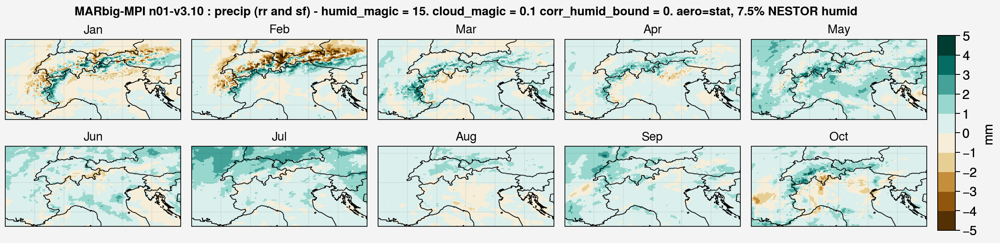

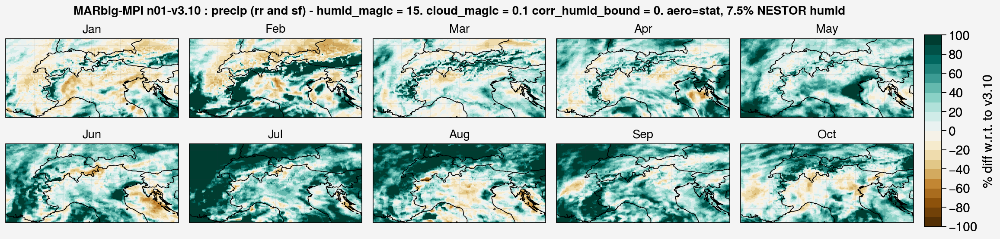

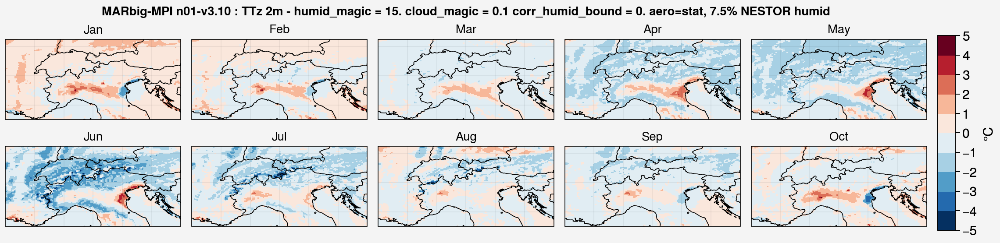

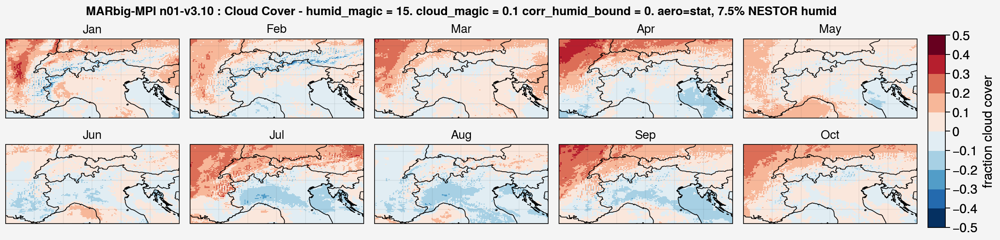

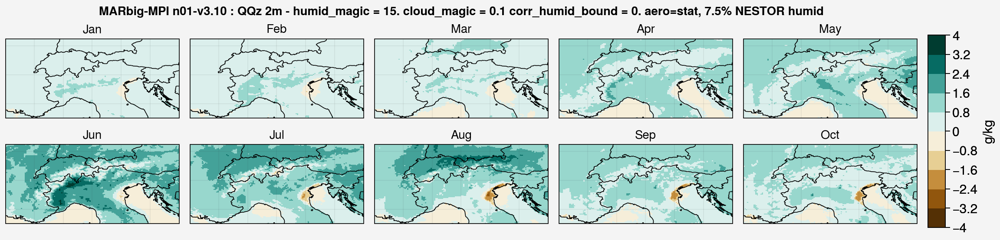

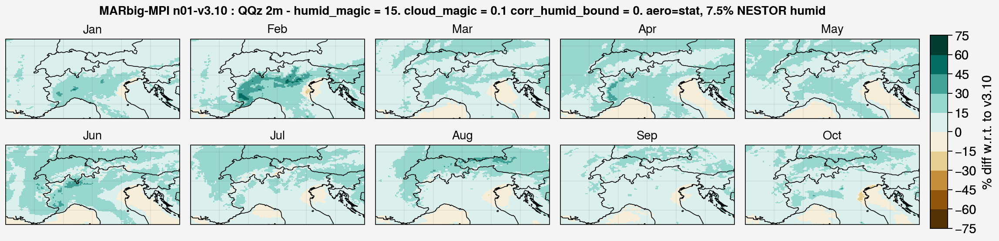

In [25]:
#n01
plot_comparison(list_ds = ds_EUn012015_precip.precip.groupby("time.month").mean() - ds_EUy2015.precip.groupby("time.month").mean()[:11],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct'],min = -5,max = 5,N=11,colormap = 'BrBG',label_var = 'mm',
                suptitle_var = 'MARbig-MPI n01-v3.10 : precip (rr and sf) - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=2,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = 100*(ds_EUn012015_precip.precip.groupby("time.month").mean() - ds_EUy2015.precip.groupby("time.month").mean()[:11])/ \
                ds_EUy2015.precip.groupby("time.month").mean()[:11],months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct'],min = -100,max = 100,N=21,
                colormap = 'BrBG',label_var = '% diff w.r.t. to v3.10',
                suptitle_var = 'MARbig-MPI n01-v3.10 : precip (rr and sf) - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=2,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))


plot_comparison(list_ds = ds_EUn012015.TTz.sel(ztqlev=2.0).groupby("time.month").mean() - ds_EUy2015.TTz.sel(ztqlev=2.0).groupby("time.month").mean()[:11],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct'],min = -5,max = 5,N=11,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'MARbig-MPI n01-v3.10 : TTz 2m - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=2,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = ds_EUn012015.CC.groupby("time.month").mean() - ds_EUy2015.CC.groupby("time.month").mean()[:11],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct'],min = -0.5,max = 0.5,N=11,colormap = 'RdBu_r',label_var = 'fraction cloud cover',
                suptitle_var = 'MARbig-MPI n01-v3.10 : Cloud Cover - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=2,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = ds_EUn012015.QQz.sel(ztqlev=2.0).groupby("time.month").mean() - ds_EUy2015.QQz.sel(ztqlev=2.0).groupby("time.month").mean()[:11],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct'],min = -4,max = 4,N=11,colormap = 'BrBG',label_var = 'g/kg',
                suptitle_var = 'MARbig-MPI n01-v3.10 : QQz 2m - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=2,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = 100*(ds_EUn012015.QQz.sel(ztqlev=2.0).groupby("time.month").mean() - ds_EUy2015.QQz.sel(ztqlev=2.0).groupby("time.month").mean()[:11])/ \
                ds_EUy2015.QQz.sel(ztqlev=2.0).groupby("time.month").mean()[:11],
                months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct'],min = -75,max = 75,N=11,colormap = 'BrBG',label_var = '% diff w.r.t. to v3.10',
                suptitle_var = 'MARbig-MPI n01-v3.10 : QQz 2m - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=2,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

In [92]:
alps28 = np.repeat(alps[np.newaxis,:,:],28,axis=0)
alps30 = np.repeat(alps[np.newaxis,:,:],30,axis=0)
alps31 = np.repeat(alps[np.newaxis,:,:],31,axis=0)

ds_v = ds_EUn012015['QQz'].sel(ztqlev=2.0)

mskJan_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-01-01','2015-01-31')), mask = np.invert(alps31)).flatten()
mskFeb_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-02-01','2015-02-28')), mask = np.invert(alps28)).flatten()
mskMar_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-03-01','2015-03-31')), mask = np.invert(alps31)).flatten()
mskApr_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-04-01','2015-04-30')), mask = np.invert(alps30)).flatten()
mskMay_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-05-01','2015-05-31')), mask = np.invert(alps31)).flatten()
mskJun_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-06-01','2015-06-30')), mask = np.invert(alps30)).flatten()
mskJul_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-07-01','2015-07-31')), mask = np.invert(alps31)).flatten()
mskAug_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-08-01','2015-08-31')), mask = np.invert(alps31)).flatten()
mskSep_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-09-01','2015-09-30')), mask = np.invert(alps30)).flatten()
mskOct_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-10-01','2015-10-31')), mask = np.invert(alps31)).flatten()

listmsk_EUn012015 = [mskJan_EUn012015, mskFeb_EUn012015, mskMar_EUn012015, mskApr_EUn012015, mskMay_EUn012015, mskJun_EUn012015, mskJul_EUn012015, mskAug_EUn012015,
                     mskSep_EUn012015, mskOct_EUn012015] 

mskJan_EUn012015.mean()

3.0292213801655143

In [93]:
# EUl or EUy depending on if forced by ERA5 or MPI

ds_v = ds_EUy2015['QQz'].sel(ztqlev=2.0)

mskJan_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-01-01','2015-01-31')), mask = np.invert(alps31)).flatten()
mskFeb_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-02-01','2015-02-28')), mask = np.invert(alps28)).flatten()
mskMar_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-03-01','2015-03-31')), mask = np.invert(alps31)).flatten()
mskApr_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-04-01','2015-04-30')), mask = np.invert(alps30)).flatten()
mskMay_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-05-01','2015-05-31')), mask = np.invert(alps31)).flatten()
mskJun_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-06-01','2015-06-30')), mask = np.invert(alps30)).flatten()
mskJul_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-07-01','2015-07-31')), mask = np.invert(alps31)).flatten()
mskAug_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-08-01','2015-08-31')), mask = np.invert(alps31)).flatten()
mskSep_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-09-01','2015-09-30')), mask = np.invert(alps30)).flatten()
mskOct_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-10-01','2015-10-31')), mask = np.invert(alps31)).flatten()

listmsk_EUy2015 = [mskJan_EUy2015, mskFeb_EUy2015, mskMar_EUy2015, mskApr_EUy2015, mskMay_EUy2015, mskJun_EUy2015, mskJul_EUy2015, mskAug_EUy2015,
                     mskSep_EUy2015, mskOct_EUy2015] 

mskJan_EUy2015.mean()

2.7656861765427276

In [94]:
# EUl or EUy depending on if forced by ERA5 or MPI

ds_v = ds_EUl2015['QQz'].sel(ztqlev=2.0)

mskJan_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-01-01','2015-01-31')), mask = np.invert(alps31)).flatten()
mskFeb_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-02-01','2015-02-28')), mask = np.invert(alps28)).flatten()
mskMar_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-03-01','2015-03-31')), mask = np.invert(alps31)).flatten()
mskApr_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-04-01','2015-04-30')), mask = np.invert(alps30)).flatten()
mskMay_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-05-01','2015-05-31')), mask = np.invert(alps31)).flatten()
mskJun_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-06-01','2015-06-30')), mask = np.invert(alps30)).flatten()
mskJul_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-07-01','2015-07-31')), mask = np.invert(alps31)).flatten()
mskAug_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-08-01','2015-08-31')), mask = np.invert(alps31)).flatten()
mskSep_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-09-01','2015-09-30')), mask = np.invert(alps30)).flatten()
mskOct_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-10-01','2015-10-31')), mask = np.invert(alps31)).flatten()

listmsk_EUl2015 = [mskJan_EUl2015, mskFeb_EUl2015, mskMar_EUl2015, mskApr_EUl2015, mskMay_EUl2015, mskJun_EUl2015, mskJul_EUl2015, mskAug_EUl2015,
                     mskSep_EUl2015, mskOct_EUl2015] 

mskJan_EUl2015.mean()

3.3706321935665557

In [17]:
Jan_EUn012015 = np.array(ds_EUn012015.CC.sel(time=slice('2015-01-01','2015-01-31'))).flatten()
Jan_EUn012015.mean()

0.7381425

{'whiskers': [<matplotlib.lines.Line2D at 0x148b38db2440>,
 'caps': [<matplotlib.lines.Line2D at 0x148b38c48460>,
 'boxes': [<matplotlib.lines.Line2D at 0x148b38db09d0>,
 'medians': [<matplotlib.lines.Line2D at 0x148b38c49180>,
 'fliers': [<matplotlib.lines.Line2D at 0x148b38c49510>,
 'means': []}

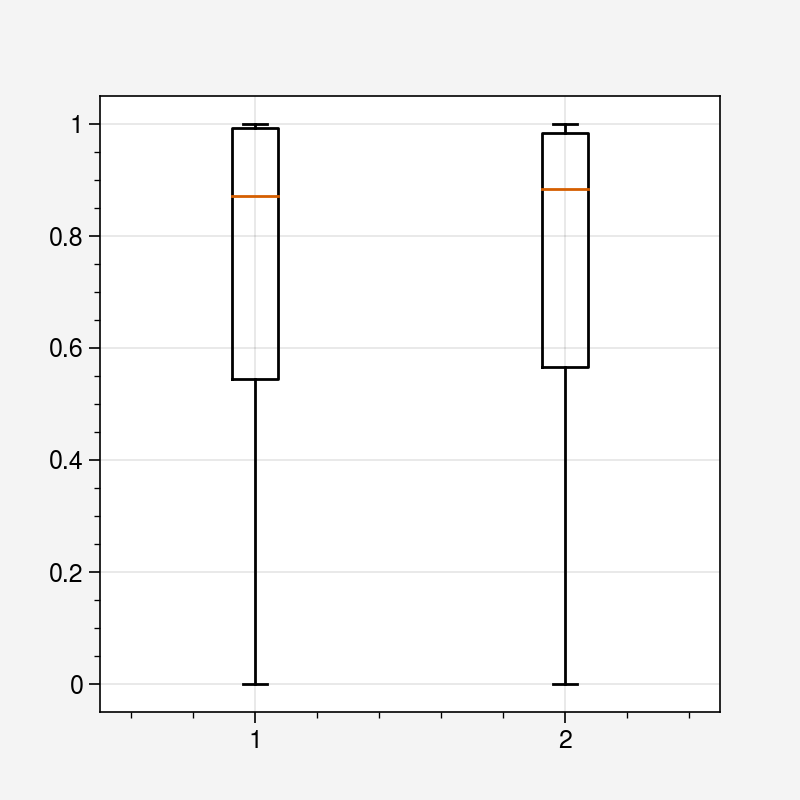

In [20]:
plt.boxplot([mskJan_EUn012015[~mskJan_EUn012015.mask],Jan_EUn012015])

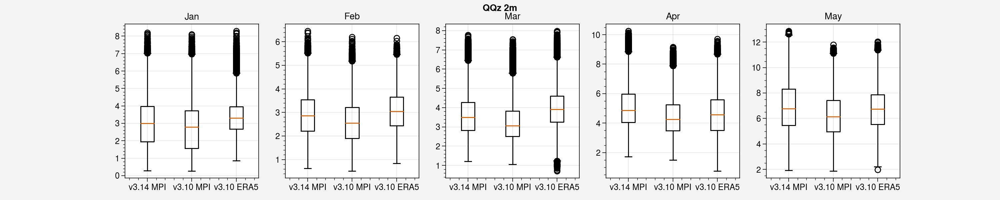

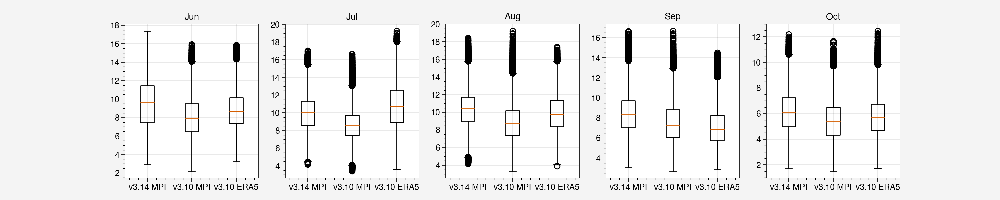

In [95]:
f,axs = plt.subplots(ncols=5)

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct']
#flierprops = dict(marker='o', markerfacecolor='n', markersize=5)

for mon in range(5):
    axs[mon].boxplot([listmsk_EUn012015[mon][~listmsk_EUn012015[mon].mask],listmsk_EUy2015[mon][~listmsk_EUy2015[mon].mask],
                      listmsk_EUl2015[mon][~listmsk_EUl2015[mon].mask]],labels=['v3.14 MPI','v3.10 MPI','v3.10 ERA5'])
    axs[mon].set_title(months[mon])

f.set_figheight(3)
f.set_figwidth(15)
f.suptitle('QQz 2m')

f,axs = plt.subplots(ncols=5)

for mon in range(5):
    axs[mon].boxplot([listmsk_EUn012015[mon+5][~listmsk_EUn012015[mon+5].mask],listmsk_EUy2015[mon+5][~listmsk_EUy2015[mon+5].mask],
                      listmsk_EUl2015[mon+5][~listmsk_EUl2015[mon+5].mask]],labels=['v3.14 MPI','v3.10 MPI','v3.10 ERA5'])
    axs[mon].set_title(months[mon+5])

f.set_figheight(3)
f.set_figwidth(15)


In [ ]:
f,axs=pplt.subplots(ncols = 2)

axs[0].box([mskJan_EUn012015,Jan_EUn012015])
#axs[1].boxplot(np.array(ds_EUn012015.CC.sel(time=slice('2015-01-01','2015-01-31'))).flatten())

### MAR-MPI : EUn n03, MARv3.14

In [29]:
# MARv3.10
name_GCM = 'MPI-ESM1-2-HR'
code_GCM = 'MPI-ESM'
scenario = 'HIST'
sim = 'EUy'
sim2 = 'EUy'
data_freq = 'daily'
data_freq_prefix = 'ICE' # ICE for daily, MON for monthly
year = 1961

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+'.TTz.'+str(year)+'.nc'
ds_EUy1961 = xr.open_dataset(ssp585_path)


ds_EUy1961['CC'] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.CC.'+str(year)+'.nc').CC
ds_EUy1961["MBrr"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBrr.'+str(year)+'.nc').MBrr
ds_EUy1961["MBsf"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MBsf.'+str(year)+'.nc').MBsf
ds_EUy1961["MB"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.MB.'+str(year)+'.nc').MB
ds_EUy1961["SWD"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.SWD.'+str(year)+'.nc').SWD
ds_EUy1961["QQz"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.QQz.'+str(year)+'.nc').QQz
ds_EUy1961["ST"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.ST.'+str(year)+'.nc').ST
ds_EUy1961["TTp"] = xr.open_dataset('/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+ \
                                   '.TTp.'+str(year)+'.nc').TTp

ds_EUy1961["precip"] = ds_EUy1961["MBrr"] + ds_EUy1961["MBsf"]

In [30]:
vars_list = ["SWU","SWD","CC","QQz","TTz","ST","MB","MBrr","MBsf"]
ds_EUn031960 = open_monthly_data_ave(vars=vars_list,year='1960',month=['09','10','11','12'],
                                     days_in_month=['30','31','30','31'],sim='n03',timestep_in_hours = 24,
                                         imin = 0, imax = None, jmin = 0, jmax = None, whichpath='castelli', combine=True, ds_sect = ds)




In [31]:
ds_EUy1961 = ds_EUy1961.assign_coords(x=ds_EUn031960.x)
ds_EUy1961 = ds_EUy1961.assign_coords(y=ds_EUn031960.y).isel(y=slice(jmin,jmax),x=slice(imin,imax))

ds_EUn031960 = ds_EUn031960.isel(y=slice(jmin,jmax),x=slice(imin,imax))

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

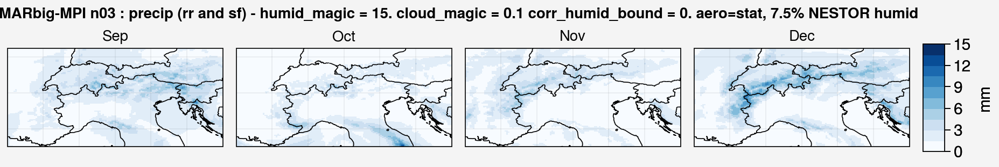

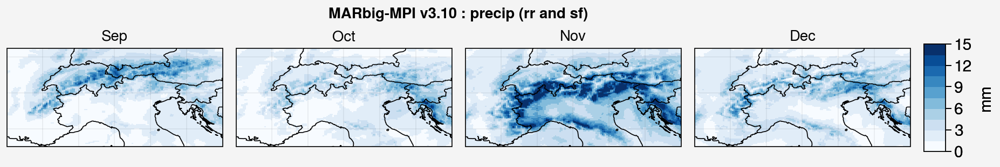

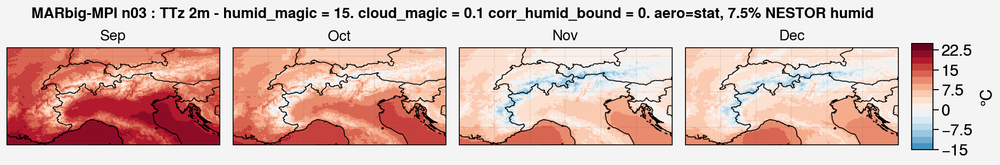

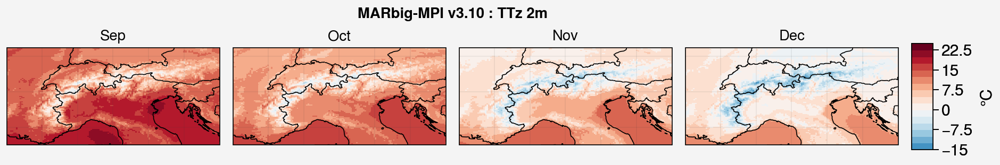

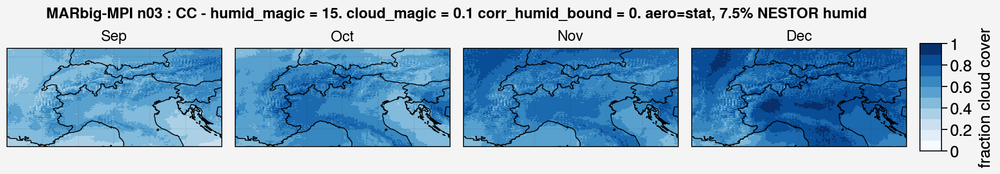

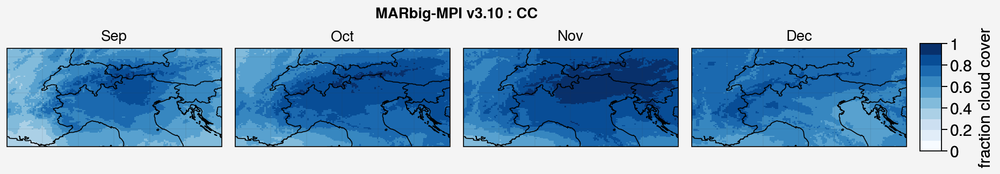

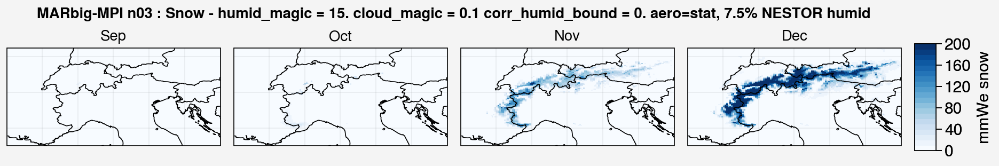

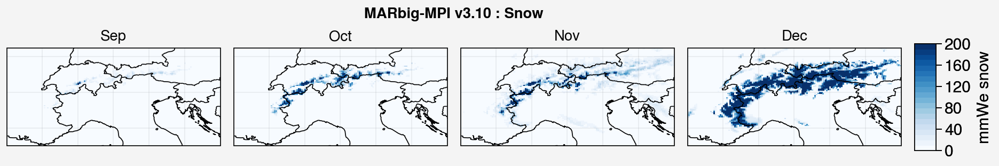

In [34]:
#n03 1960 vs v3.10 1961 (eye test)
plot_comparison(list_ds = ds_EUn031960.precip.groupby("time.month").mean(),
                months = ['Sep','Oct','Nov','Dec'],min = 0,max = 15,N=11,colormap = 'Blues',label_var = 'mm',
                suptitle_var = 'MARbig-MPI n03 : precip (rr and sf) - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = ds_EUy1961.precip.groupby("time.month").mean()[8:],
                months = ['Sep','Oct','Nov','Dec'],min = 0,max = 15,N=11,colormap = 'Blues',label_var = 'mm',
                suptitle_var = 'MARbig-MPI v3.10 : precip (rr and sf)',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))


plot_comparison(list_ds = ds_EUn031960.TTz.sel(ztqlev=2.0).groupby("time.month").mean(),
                months = ['Sep','Oct','Nov','Dec'],min = -15,max = 25,N=17,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'MARbig-MPI n03 : TTz 2m - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = ds_EUy1961.TTz.sel(ztqlev=2.0).groupby("time.month").mean()[8:],
                months = ['Sep','Oct','Nov','Dec'],min = -15,max = 25,N=17,colormap = 'RdBu_r',label_var = '°C',
                suptitle_var = 'MARbig-MPI v3.10 : TTz 2m',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))


plot_comparison(list_ds = ds_EUn031960.CC.groupby("time.month").mean(),
                months = ['Sep','Oct','Nov','Dec'],min = 0,max = 1,N=11,colormap = 'Blues',label_var = 'fraction cloud cover',
                suptitle_var = 'MARbig-MPI n03 : CC - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = ds_EUy1961.CC.groupby("time.month").mean()[8:],
                months = ['Sep','Oct','Nov','Dec'],min = 0,max = 1,N=11,colormap = 'Blues',label_var = 'fraction cloud cover',
                suptitle_var = 'MARbig-MPI v3.10 : CC',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))


plot_comparison(list_ds = ds_EUn031960.MB.max(axis=1).groupby("time.month").mean(),
                months = ['Sep','Oct','Nov','Dec'],min = 0,max = 200,N=21,colormap = 'Blues',label_var = 'mmWe snow',
                suptitle_var = 'MARbig-MPI n03 : Snow - humid_magic = 15. cloud_magic = 0.1 corr_humid_bound = 0. aero=stat, 7.5% NESTOR humid',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

plot_comparison(list_ds = ds_EUy1961.MB.max(axis=1).groupby("time.month").mean()[8:],
                months = ['Sep','Oct','Nov','Dec'],min = 0,max = 200,N=21,colormap = 'Blues',label_var = 'mmWe snow',
                suptitle_var = 'MARbig-MPI v3.10 : Snow',
                rows=1,cols=4,ds_size=ds_big.isel(y=slice(jmin,jmax),x=slice(imin,imax)))

## As a function of altitude

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


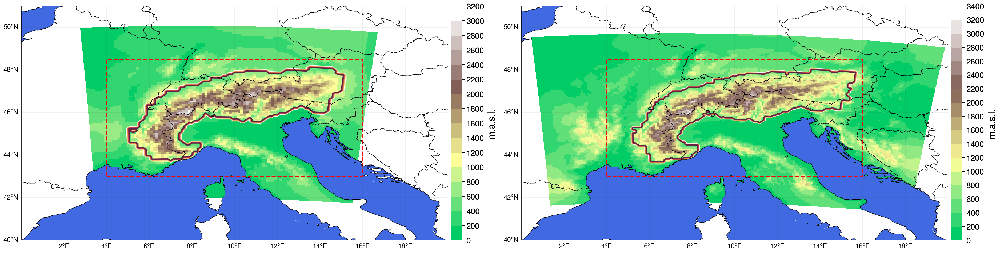

In [11]:
pplt.rc['figure.facecolor'] = 'white'

colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=2)
m=axs[0].pcolormesh(ds_smallish.LON, ds_smallish.LAT, ds_smallish.SH, levels=17,cmap=colors_land)
axs[0].colorbar(m,label= 'm.a.s.l.',labelsize='x-large',ticklabelsize='large')
axs[0].plot([4.,16.,16,4,4],[43.,43,48.5,48.5,43],'--r')
axs[0].contour(lon_smallish, lat_smallish, alps_smallish)

m=axs[1].pcolormesh(ds.LON, ds.LAT, ds.SH, levels=17,cmap=colors_land)
axs[1].colorbar(m,label= 'm.a.s.l.',labelsize='x-large',ticklabelsize='large')
axs[1].plot([4.,16.,16,4,4],[43.,43,48.5,48.5,43],'--r')
axs[1].contour(lon, lat, alps)

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[40.,51.],lonlim=[0.,20.])


In [23]:
# Levels (altitude bands)

alps = alps_smallish
H = ds_smallish.SH

levels = [np.logical_and(alps,H<400), np.logical_and(alps,np.logical_and(H>=400,H<600)), np.logical_and(alps,np.logical_and(H>=600,H<800)),
          np.logical_and(alps,np.logical_and(H>=800,H<1000)), np.logical_and(alps,np.logical_and(H>=1000,H<1200)), np.logical_and(alps,np.logical_and(H>=1200,H<1400)),
          np.logical_and(alps,np.logical_and(H>=1400,H<1600)), np.logical_and(alps,np.logical_and(H>=1600,H<1800)), np.logical_and(alps,np.logical_and(H>=1800,H<2000)),
          np.logical_and(alps,np.logical_and(H>=2000,H<2200)), np.logical_and(alps,np.logical_and(H>=2200,H<2400)), np.logical_and(alps,np.logical_and(H>=2400,H<2600)),
          np.logical_and(alps,np.logical_and(H>=2600,H<2800)), np.logical_and(alps,np.logical_and(H>=2800,H<3000)),
          np.logical_and(alps,H>=3000)]#,
          #alps]

H_levels = [300,500,700,900,1100,1300,1500,1700,1900,2100,2300,2500,2700,2900,3100]

In [ ]:
names_var = ['NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt','Surf_Bal'],
colors = ['y','m','purple','lightblue','orange','blue','brown','r','green','k']

In [11]:
path = '/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/'
ds_yrsv310 = xr.open_dataset(path + 'ds_Surfbal_vars_2015_2100_seas.npy')#.sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

ds_yrsv310

<xarray.Dataset>
Dimensions:  (Year: 86, season: 4, y: 126, x: 201, sector: 3, atmlay: 3,
              ztqlev: 4)
Coordinates:
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
  * ztqlev   (ztqlev) float32 2.0 10.0 50.0 100.0
  * sector   (sector) float32 1.0 2.0 3.0
  * atmlay   (atmlay) float32 0.9997 0.9995 0.999
  * season   (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * Year     (Year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
Data variables: (12/14)
    LWD      (Year, season, y, x) float64 ...
    LWU      (Year, season, y, x) float64 ...
    SWD      (Year, season, y, x) float64 ...
    SWU      (Year, season, y, x) float64 ...
    SHF      (Year, season, y, x) float64 ...
    LHF      (Year, season, y, x) float64 ...
    ...       ...
    TTmax    (Year, season, atmlay, y, x) float64 ...
    melt     (Year, season, y, x) float64 ...
    NSW      (Year, season, y, x) float64 ...
    NLW      (Year, season, y, x) float64 ...
    Surfbal  (Year, season, y, x) float64 ...
    TTz      (Year, season, ztqlev, y, x) float64 ...

In [13]:
ds_sect = ds_big
Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
t_timestep = 60*60*24 # 60*60*24 seconds in a day
scen = 'HIST'

path = '/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/'+scen+'/daily/ICE.MPI-ESM_'
code = 'y'

ds_yrs = xr.open_dataset(path+'HIST.EU'+code+'.TTmax.1961.nc').isel(atmlay=0,y=slice(jmin,jmax),x=slice(imin,imax)).mean(dim=('x','y')).max(dim='time')

for year in range(1962,2101):
    print(year,end=' ')
    if year==2004:
        path = '/bettik/castelli/data/MAR-MPI-ESM/HIST/ICE.MPI-ESM_'
    elif year<=2014:
        path = '/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/'+scen+'/daily/ICE.MPI-ESM_'
    if year>2014:
        scen = 'SSP585'
        path = '/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/'+scen+'/daily/ICE.MPI-ESM_'
    
    ds_yr = xr.open_dataset(path+scen+'.EU'+code+'.TTmax.'+str(year)+'.nc').isel(atmlay=0,\
                                                                                 y=slice(jmin,jmax),x=slice(imin,imax)).mean(dim=('x','y')).max(dim='time')
    ds_yrs = xr.concat([ds_yrs,ds_yr], dim='Year')


1962 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031 2032 2033 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045 2046 2047 2048 2049 2050 2051 2052 2053 2054 2055 2056 2057 2058 2059 2060 2061 2062 2063 2064 2065 2066 2067 2068 2069 2070 2071 2072 2073 2074 2075 2076 2077 2078 2079 2080 2081 2082 2083 2084 2085 2086 2087 2088 2089 2090 2091 2092 2093 2094 2095 2096 2097 2098 2099 2100 

In [14]:
scen = 'HIST'

path = '/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/'+scen+'/daily/ICE.MPI-ESM_'
code = 'y'

ds_yrs2 = xr.open_dataset(path+'HIST.EU'+code+'.TTmax.1961.nc').isel(atmlay=0,y=slice(jmin,jmax),x=slice(imin,imax)).mean(dim=('x','y')).max(dim='time')

for year in range(1962,2101):
    print(year,end=' ')
    if year==2004:
        path = '/bettik/castelli/data/MAR-MPI-ESM/HIST/ICE.MPI-ESM_'
    elif year<=2014:
        path = '/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/'+scen+'/daily/ICE.MPI-ESM_'
    if year>2014:
        scen = 'SSP585'
        path = '/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/'+scen+'/daily/ICE.MPI-ESM_'
    
    ds_yr = xr.open_dataset(path+scen+'.EU'+code+'.TTmax.'+str(year)+'.nc').isel(atmlay=0,\
                                                                                 y=slice(jmin,jmax),x=slice(imin,imax)).max()
    ds_yrs2 = xr.concat([ds_yrs2,ds_yr], dim='Year')


1962 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031 2032 2033 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045 2046 2047 2048 2049 2050 2051 2052 2053 2054 2055 2056 2057 2058 2059 2060 2061 2062 2063 2064 2065 2066 2067 2068 2069 2070 2071 2072 2073 2074 2075 2076 2077 2078 2079 2080 2081 2082 2083 2084 2085 2086 2087 2088 2089 2090 2091 2092 2093 2094 2095 2096 2097 2098 2099 2100 

In [15]:
yrs = np.arange(1961,2101)

ds_yrs = ds_yrs.assign_coords(Year=("Year", yrs))
ds_yrs2 = ds_yrs2.assign_coords(Year=("Year", yrs))


ds_yrs


<xarray.Dataset>
Dimensions:  (Year: 140)
Coordinates:
    atmlay   float32 0.9997
  * Year     (Year) int64 1961 1962 1963 1964 1965 ... 2096 2097 2098 2099 2100
Data variables:
    TTmax    (Year) float32 31.2 29.44 30.96 30.71 ... 35.45 38.02 37.18 41.2

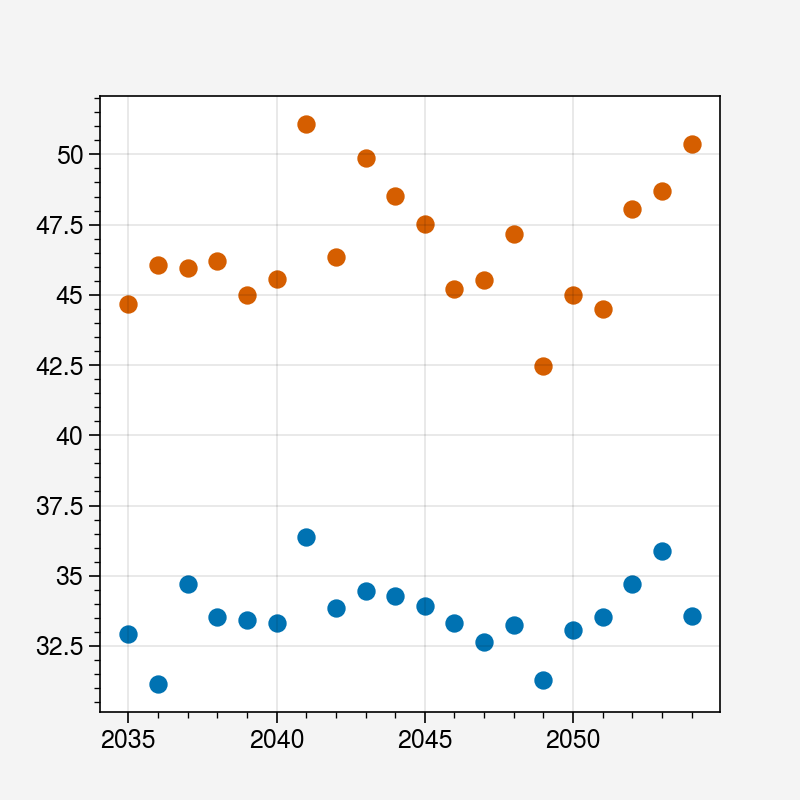

In [18]:
start = 2035
end = 2054

plt.scatter(range(start,end+1),ds_yrs.TTmax.sel(Year=slice(start,end)))
plt.scatter(range(start,end+1),ds_yrs2.TTmax.sel(Year=slice(start,end)))

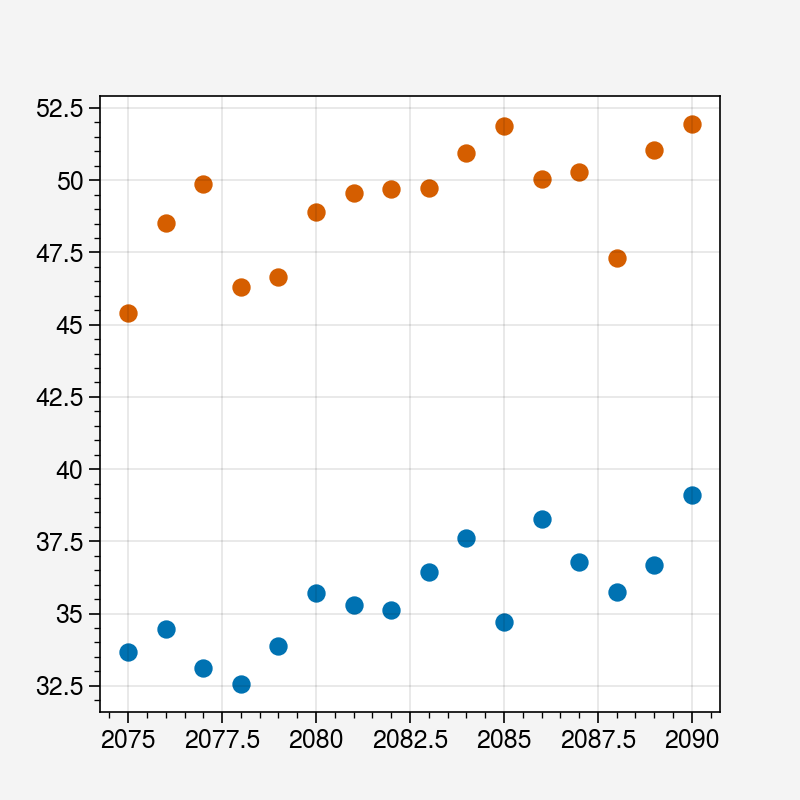

In [32]:
plt.scatter(range(2075,2091),ds_yrs.TTmax.sel(Year=slice(2075,2090)))
plt.scatter(range(2075,2091),ds_yrs2.TTmax.sel(Year=slice(2075,2090)))

Selected years for testing chunks to see if it is stable with no limit on ST in sisvat_tso : 2041 and 2084, which are both very warm years in terms of TTmax. (both max on domain and averaged over domain)

### Testing EUn sim compared to obs and previous sims

In [11]:
# MARv3.14
name_GCM = 'MPI-ESM'
code_GCM = 'MPI-ESM'
#scenario = 'SSP585'
sim = 'EUn'
sim2 = 'EUn'
data_freq = 'daily'
data_freq_prefix = 'ICE' # ICE for daily, MON for monthly
year = 1979

ssp585_path = '/bettik/castelli/data/MAR-'+name_GCM+'/v3.14/bigdomain/HIST/'+data_freq_prefix+'.'+code_GCM+'_HIST.'+sim2
ds_EUn1979 = xr.open_dataset(ssp585_path+'.MBrr.'+str(year)+'.nc')

ds_EUn1979["MBsf"] = xr.open_dataset(ssp585_path+'.MBsf.'+str(year)+'.nc').MBsf
ds_EUn1979["TTz"] = xr.open_dataset(ssp585_path+'.TTz.'+str(year)+'.nc').TTz

ds_EUn1979["precip"] = ds_EUn1979["MBrr"] + ds_EUn1979["MBsf"]

# v3.10
sim = 'EUy'
sim2 = 'EUy'

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'1-2-HR/HIST/daily/'+data_freq_prefix+'.'+code_GCM+'_HIST.'+sim2
ds_EUy1979 = xr.open_dataset(ssp585_path+'.MBrr.'+str(year)+'.nc')

ds_EUy1979["MBsf"] = xr.open_dataset(ssp585_path+'.MBsf.'+str(year)+'.nc').MBsf
ds_EUy1979["TTz"] = xr.open_dataset(ssp585_path+'.TTz.'+str(year)+'.nc').TTz

ds_EUy1979["precip"] = ds_EUy1979["MBrr"] + ds_EUy1979["MBsf"]

In [12]:
year = 2006

# MARv3.14
sim = 'EUn'
sim2 = 'EUn'

ssp585_path = '/bettik/castelli/data/MAR-'+name_GCM+'/v3.14/bigdomain/HIST/'+data_freq_prefix+'.'+code_GCM+'_HIST.'+sim2
ds_EUn2006 = xr.open_dataset(ssp585_path+'.MBrr.'+str(year)+'.nc')

ds_EUn2006["MBsf"] = xr.open_dataset(ssp585_path+'.MBsf.'+str(year)+'.nc').MBsf
ds_EUn2006["TTz"] = xr.open_dataset(ssp585_path+'.TTz.'+str(year)+'.nc').TTz

ds_EUn2006["precip"] = ds_EUn2006["MBrr"] + ds_EUn2006["MBsf"]

# MARv3.10
sim = 'EUy'
sim2 = 'EUy'

ssp585_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'1-2-HR/HIST/daily/'+data_freq_prefix+'.'+code_GCM+'_HIST.'+sim2
ds_EUy2006 = xr.open_dataset(ssp585_path+'.MBrr.'+str(year)+'.nc')

ds_EUy2006["MBsf"] = xr.open_dataset(ssp585_path+'.MBsf.'+str(year)+'.nc').MBsf
ds_EUy2006["TTz"] = xr.open_dataset(ssp585_path+'.TTz.'+str(year)+'.nc').TTz

ds_EUy2006["precip"] = ds_EUy2006["MBrr"] + ds_EUy2006["MBsf"]

In [12]:
ds_EUn1979

<xarray.Dataset>
Dimensions:  (time: 365, y: 126, x: 201)
Coordinates:
  * time     (time) datetime64[ns] 1979-01-01T12:00:00 ... 1979-12-31T12:00:00
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
Data variables:
    MBrr     (time, y, x) float32 ...
    MBsf     (time, y, x) float32 ...
    precip   (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        ICE - Exp: n09 - 19790101
    institution:  ULg (Xavier Fettweis)
    history:      Wed Aug  6 16:43:26 2025: ncks -v MBrr /bettik/castelli/MAR...
    netcdf:       4.8.0 of May  2 2023 12:43:48 $
    NCO:          netCDF Operators version 5.0.6 (Homepage = http://nco.sf.ne...

In [13]:
ds_APGD = xr.open_dataset('/bettik/menegozm/EURO4M_APGD/06-coord_lonlat.nc')
ds_APGD = ds_APGD.rename_vars({'Longitude':'LON','Latitude':'LAT'})

ds_APGD1979 = xr.open_dataset('/bettik/castelli/data/EURO4M_APGD/APGD_1979.nc').PRECIPITATION
ds_APGD2006 = xr.open_dataset('/bettik/castelli/data/EURO4M_APGD/APGD_2006.nc').PRECIPITATION

ds_APGD1979

<xarray.DataArray 'PRECIPITATION' (time: 365, Y: 138, X: 243)>
[12239910 values with dtype=float32]
Coordinates:
  * X        (X) float64 3.675e+06 3.68e+06 3.685e+06 ... 4.88e+06 4.885e+06
  * Y        (Y) float64 2.21e+06 2.215e+06 2.22e+06 ... 2.89e+06 2.895e+06
  * time     (time) datetime64[ns] 1979-01-01 1979-01-02 ... 1979-12-31
    lon      (Y, X) float32 ...
    lat      (Y, X) float32 ...
Attributes:
    units:         mm.d-1
    grid_mapping:  ETRS89-LAEA
    long_name:     PRECIPITATION
    grid_name:     al05.etrs.laea
    version:       v1.2
    prod_date:     2014-04-10
    cell_methods:  time: mean

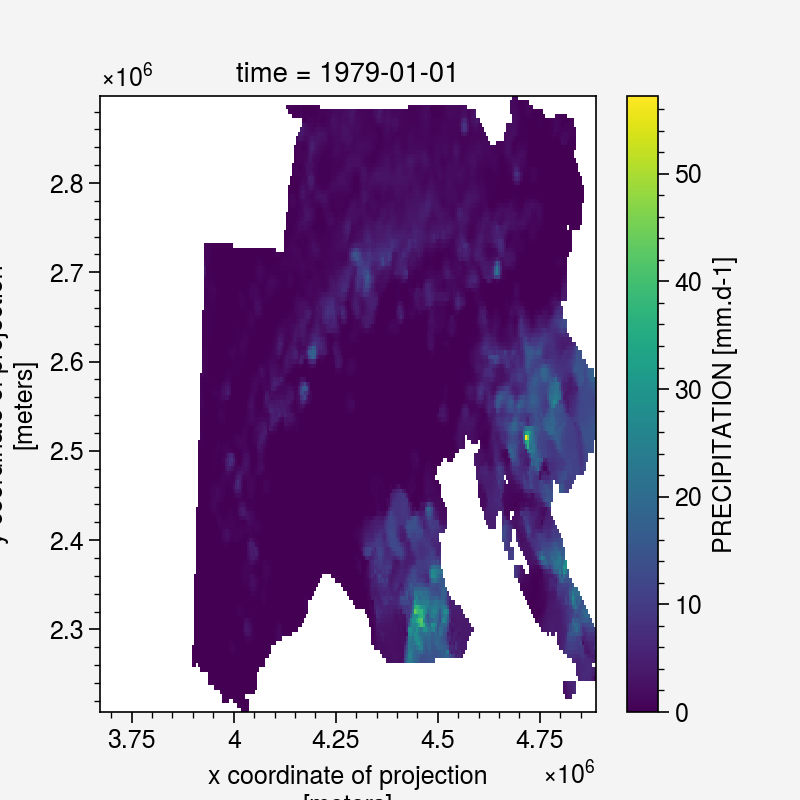

In [14]:
ds_APGD1979[0].plot()

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

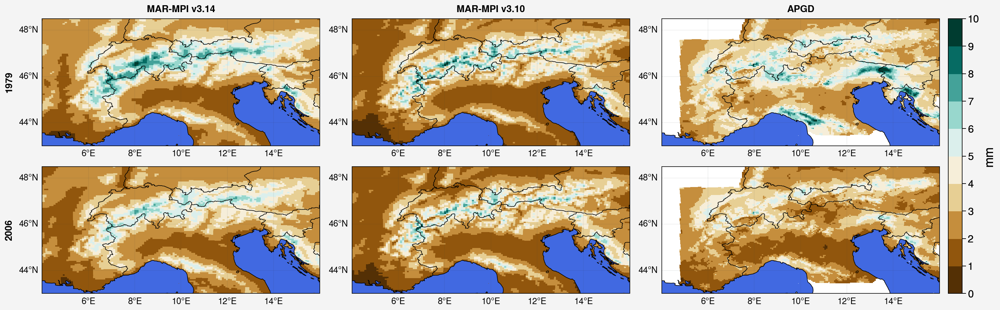

In [44]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,ncols=3,nrows=2)

m=axs[0].pcolormesh(ds.LON, ds.LAT, ds_EUn1979.precip.mean(dim='time'), levels=np.arange(0,11,1),cmap='BrBG')
m=axs[3].pcolormesh(ds.LON, ds.LAT, ds_EUn2006.precip.mean(dim='time'), levels=np.arange(0,11,1),cmap='BrBG')
#axs[0].colorbar(m,label= 'mm',labelsize='x-large',ticklabelsize='large')

m=axs[1].pcolormesh(ds.LON, ds.LAT, ds_EUy1979.precip.mean(dim='time'), levels=np.arange(0,11,1),cmap='BrBG')
m=axs[4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006.precip.mean(dim='time'), levels=np.arange(0,11,1),cmap='BrBG')

m=axs[2].pcolormesh(ds_APGD.LON, ds_APGD.LAT, ds_APGD1979.mean(dim='time'), levels=np.arange(0,11,1),cmap='BrBG')
m=axs[5].pcolormesh(ds_APGD.LON, ds_APGD.LAT, ds_APGD2006.mean(dim='time'), levels=np.arange(0,11,1),cmap='BrBG')

f.colorbar(m,label= 'mm',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['MAR-MPI v3.14','MAR-MPI v3.10','APGD'],rowlabels=['1979','2006'])

In [14]:
ds_EUn1979_seas = season_mean(ds_EUn1979).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))
ds_EUn2006_seas = season_mean(ds_EUn2006).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

ds_EUy1979_seas = season_mean(ds_EUy1979).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))
ds_EUy2006_seas = season_mean(ds_EUy2006).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

ds_APGD1979_seas = season_mean(ds_APGD1979).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))
ds_APGD2006_seas = season_mean(ds_APGD2006).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

In [29]:
ds_EUn1979_seas

<xarray.Dataset>
Dimensions:  (x: 201, y: 126, ztqlev: 3, season: 4)
Coordinates:
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
  * ztqlev   (ztqlev) float32 2.0 10.0 100.0
  * season   (season) object 'DJF' 'MAM' 'JJA' 'SON'
Data variables:
    MBrr     (season, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    MBsf     (season, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    TTz      (season, ztqlev, y, x) float64 7.774 7.893 8.051 ... 6.954 6.955
    precip   (season, y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

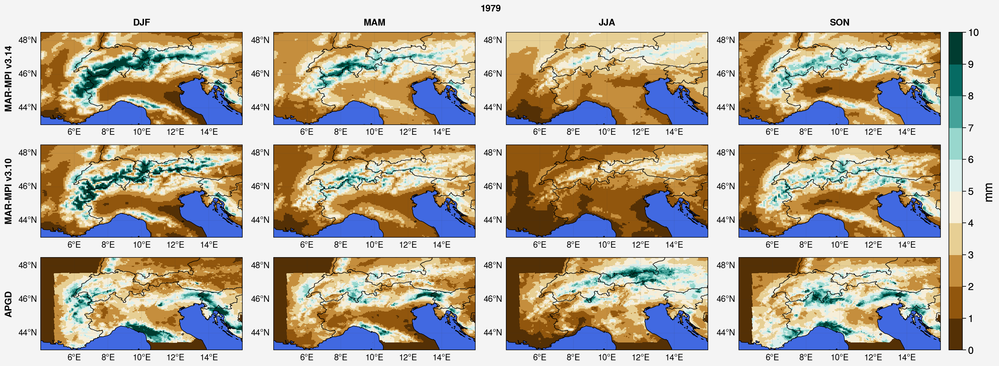

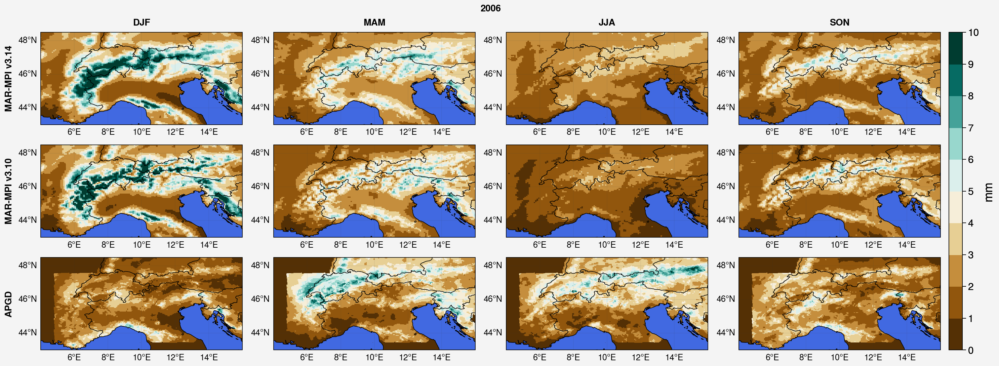

In [43]:
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=4,nrows=3)

for seas in range(4):
    m=axs[seas].pcolormesh(ds.LON, ds.LAT, ds_EUn1979_seas.precip[seas], levels=np.arange(0,11,1),cmap='BrBG')

    m=axs[seas+4].pcolormesh(ds.LON, ds.LAT, ds_EUy1979_seas.precip[seas], levels=np.arange(0,11,1),cmap='BrBG')

    m=axs[seas+8].pcolormesh(ds_APGD.LON, ds_APGD.LAT, ds_APGD1979_seas[seas], levels=np.arange(0,11,1),cmap='BrBG')

f.colorbar(m,label= 'mm',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['DJF','MAM','JJA','SON'],
         rowlabels=['MAR-MPI v3.14','MAR-MPI v3.10','APGD'],suptitle='1979')

# ----------------------- 2006 ---------------------------------
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=4,nrows=3)

for seas in range(4):
    m=axs[seas].pcolormesh(ds.LON, ds.LAT, ds_EUn2006_seas.precip[seas], levels=np.arange(0,11,1),cmap='BrBG')

    m=axs[seas+4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006_seas.precip[seas], levels=np.arange(0,11,1),cmap='BrBG')

    m=axs[seas+8].pcolormesh(ds_APGD.LON, ds_APGD.LAT, ds_APGD2006_seas[seas], levels=np.arange(0,11,1),cmap='BrBG')

f.colorbar(m,label= 'mm',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['DJF','MAM','JJA','SON'],
         rowlabels=['MAR-MPI v3.14','MAR-MPI v3.10','APGD'],suptitle='2006')

In [15]:
ds_TG_EOBS = xr.open_dataset('/bettik/castelli/data/E-OBS/tg_ens_mean_0.1deg_reg_v29.0e.nc').tg.isel(latitude=np.arange(170,250,1),longitude=np.arange(280,430,1))


In [16]:
ds_TG_EOBS_1979_seas = season_mean(ds_TG_EOBS.sel(time='1979')).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))
ds_TG_EOBS_2006_seas = season_mean(ds_TG_EOBS.sel(time='2006')).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

ds_TG_EOBS_1979_seas

<xarray.DataArray (season: 4, latitude: 80, longitude: 150)>
array([[[ 8.87566648,  8.93077755,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 8.97544423,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 9.21277755,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 1.52366664,  1.34944442,  1.17033332, ..., -2.32699994,
         -2.04066661, -1.62777774],
        [ 1.38499997,  1.20422223,  1.0442222 , ..., -2.07733327,
         -1.86366662, -1.91599997],
        [ 1.28911106,  1.08477777,  0.88766663, ..., -1.55633331,
         -1.35099997, -1.37255551]],

       [[13.15130414, 13.09467361,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [13.21923883,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [13.37282588,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
...
        [16.08380403, 15.97999969, 15.88804308, ..., 15.49934744,
         15.7914127 , 16.32771696],
        [15.95565179, 15.81217357, 15.72956489, ..., 15.75760833,
         16.03239092, 15.90293443],
        [15.83630404, 15.69597793, 15.57956494, ..., 16.25184751,
         16.64260836, 16.6576083 ]],

       [[15.54571396, 15.5909887 ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [15.64813156,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [15.82901068,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [10.7965932 , 10.65791179, 10.47571408, ...,  6.84417567,
          7.11428557,  7.56791191],
        [10.72626349, 10.56197776, 10.39274699, ...,  7.05824163,
          7.29560422,  7.2285713 ],
        [10.63879097, 10.4552745 , 10.27252725, ...,  7.53538444,
          7.8349449 ,  7.86868118]]])
Coordinates:
  * latitude   (latitude) float64 42.05 42.15 42.25 42.35 ... 49.75 49.85 49.95
  * longitude  (longitude) float64 3.05 3.15 3.25 3.35 ... 17.75 17.85 17.95
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

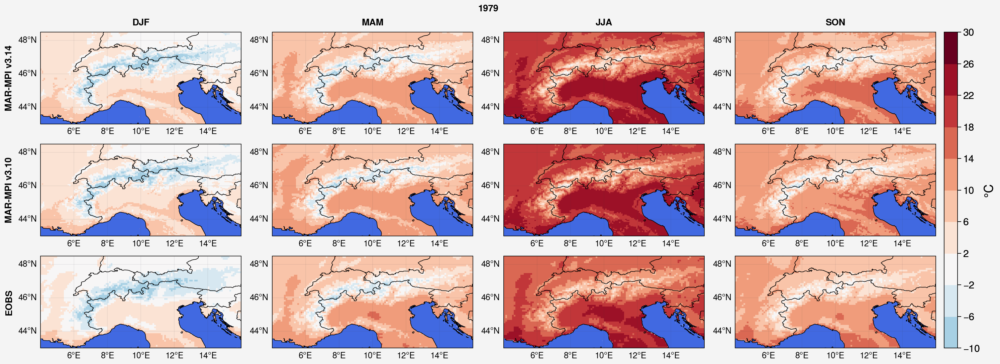

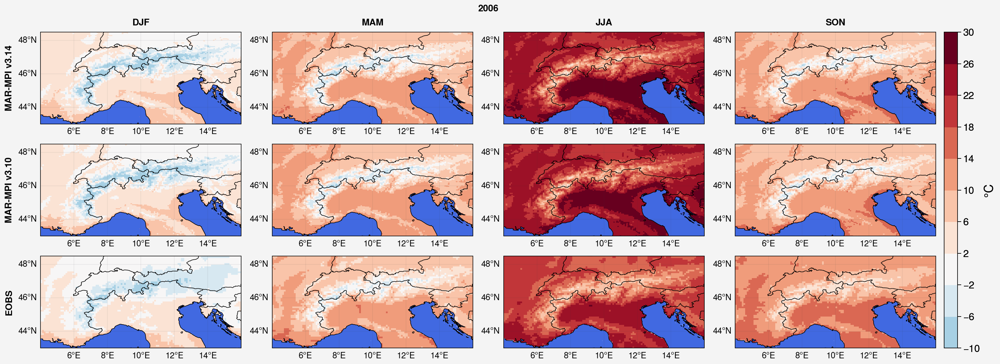

In [45]:
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=4,nrows=3)

for seas in range(4):
    m=axs[seas].pcolormesh(ds.LON, ds.LAT, ds_EUn1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,34,4),cmap='RdBu_r')

    m=axs[seas+4].pcolormesh(ds.LON, ds.LAT, ds_EUy1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,34,4),cmap='RdBu_r')

    m=axs[seas+8].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_1979_seas[seas], levels=np.arange(-10,34,4),cmap='RdBu_r')

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['DJF','MAM','JJA','SON'],
         rowlabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],suptitle='1979')

# ----------------------- 2006 ---------------------------------
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=4,nrows=3)

for seas in range(4):
    m=axs[seas].pcolormesh(ds.LON, ds.LAT, ds_EUn2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,34,4),cmap='RdBu_r')

    m=axs[seas+4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,34,4),cmap='RdBu_r')

    m=axs[seas+8].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_2006_seas[seas], levels=np.arange(-10,34,4),cmap='RdBu_r')

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['DJF','MAM','JJA','SON'],
         rowlabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],suptitle='2006')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

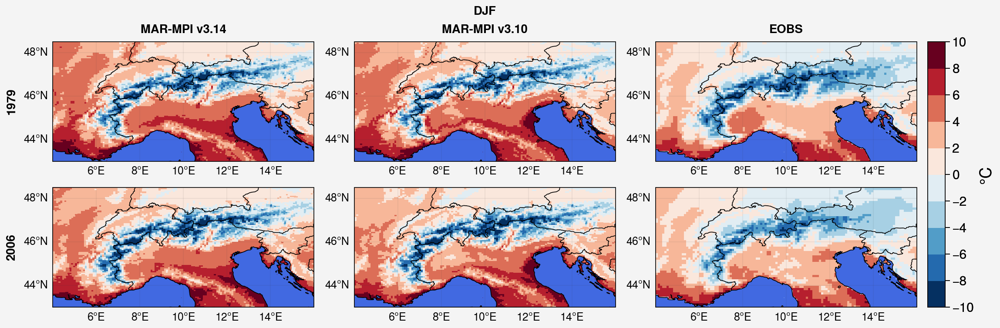

In [46]:
# -------------- DJF ----------------
seas=0
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=3,nrows=2)

m=axs[seas].pcolormesh(ds.LON, ds.LAT, ds_EUn1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,12,2),cmap='RdBu_r')

m=axs[seas+1].pcolormesh(ds.LON, ds.LAT, ds_EUy1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,12,2),cmap='RdBu_r')

m=axs[seas+2].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_1979_seas[seas], levels=np.arange(-10,12,2),cmap='RdBu_r')


m=axs[seas+3].pcolormesh(ds.LON, ds.LAT, ds_EUn2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,12,2),cmap='RdBu_r')

m=axs[seas+4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,12,2),cmap='RdBu_r')

m=axs[seas+5].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_2006_seas[seas], levels=np.arange(-10,12,2),cmap='RdBu_r')

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],
         rowlabels=['1979','2006'],suptitle='DJF')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

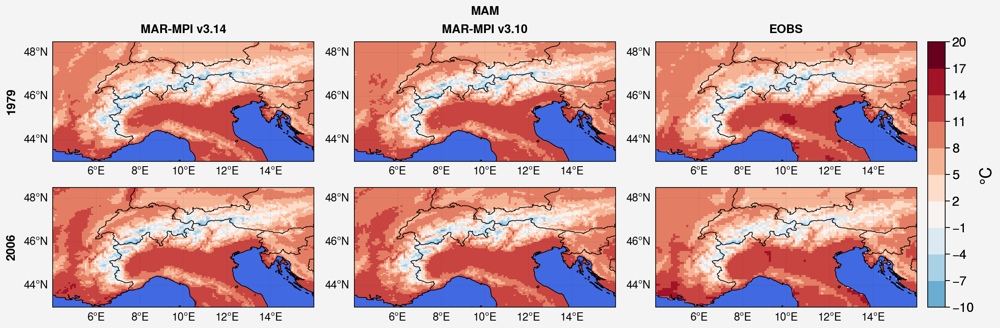

In [49]:
# -------------- MAM ----------------
seas=1
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=3,nrows=2)

m=axs[0].pcolormesh(ds.LON, ds.LAT, ds_EUn1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,23,3),cmap='RdBu_r')

m=axs[1].pcolormesh(ds.LON, ds.LAT, ds_EUy1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,23,3),cmap='RdBu_r')

m=axs[2].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_1979_seas[seas], levels=np.arange(-10,23,3),cmap='RdBu_r')


m=axs[3].pcolormesh(ds.LON, ds.LAT, ds_EUn2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,23,3),cmap='RdBu_r')

m=axs[4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=np.arange(-10,23,3),cmap='RdBu_r')

m=axs[5].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_2006_seas[seas], levels=np.arange(-10,23,3),cmap='RdBu_r')

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],
         rowlabels=['1979','2006'],suptitle='MAM')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

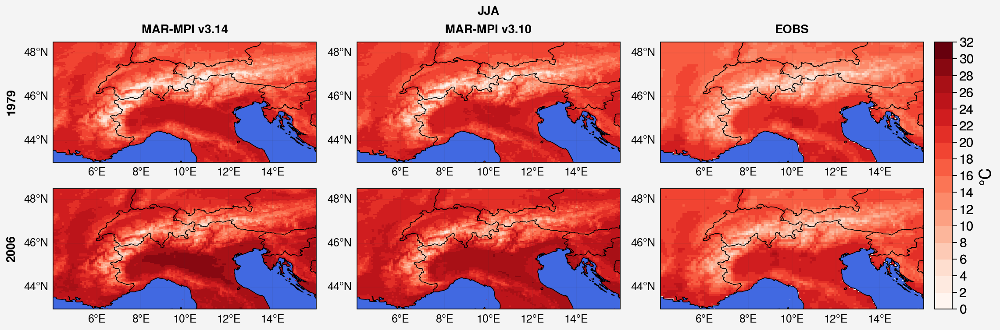

In [18]:
# -------------- JJA ----------------
seas=2
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=3,nrows=2)

lvl_range = np.arange(0,34,2)

m=axs[0].pcolormesh(ds.LON, ds.LAT, ds_EUn1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap='Reds')

m=axs[1].pcolormesh(ds.LON, ds.LAT, ds_EUy1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap='Reds')

m=axs[2].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_1979_seas[seas], levels=lvl_range,cmap='Reds')


m=axs[3].pcolormesh(ds.LON, ds.LAT, ds_EUn2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap='Reds')

m=axs[4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap='Reds')

m=axs[5].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_2006_seas[seas], levels=lvl_range,cmap='Reds')

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],
         rowlabels=['1979','2006'],suptitle='JJA')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

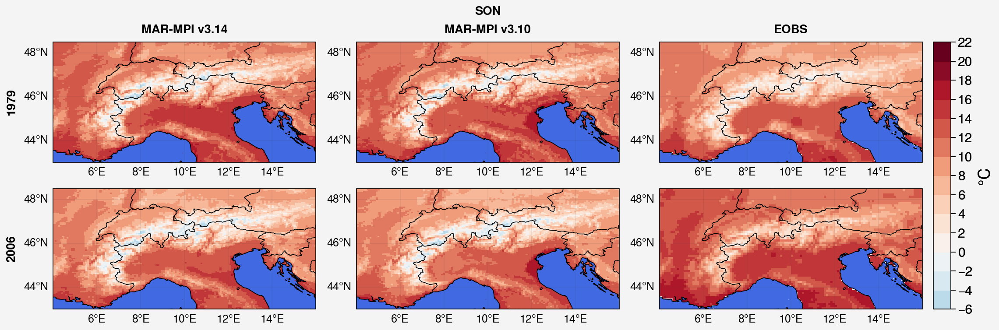

In [20]:
# -------------- SON ----------------
seas=3
f, axs = pplt.subplots(proj='cyl', axwidth=3,ncols=3,nrows=2)

lvl_range = np.arange(-6,24,2)
cmaps = 'RdBu_r'

m=axs[0].pcolormesh(ds.LON, ds.LAT, ds_EUn1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap=cmaps)

m=axs[1].pcolormesh(ds.LON, ds.LAT, ds_EUy1979_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap=cmaps)

m=axs[2].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_1979_seas[seas], levels=lvl_range,cmap=cmaps)


m=axs[3].pcolormesh(ds.LON, ds.LAT, ds_EUn2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap=cmaps)

m=axs[4].pcolormesh(ds.LON, ds.LAT, ds_EUy2006_seas.TTz.sel(ztqlev=2.0)[seas], levels=lvl_range,cmap=cmaps)

m=axs[5].pcolormesh(ds_TG_EOBS.longitude, ds_TG_EOBS.latitude, ds_TG_EOBS_2006_seas[seas], levels=lvl_range,cmap=cmaps)

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],collabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],
         rowlabels=['1979','2006'],suptitle='SON')